In [1]:
%pip install easyimages

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Obtaining dependency information for pycocotools from https://files.pythonhosted.org/packages/ba/64/0451cf41a00fd5ac4501de4ea0e395b7d909e09d665e56890b5d3809ae26/pycocotools-2.0.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 17.0 MB/s eta 0:00:00
  Created wheel for imutils: filename=imutils-0.4.6-py3-none-any.whl size=22819 sha256=a3d88fc17d7ea756147402335c390f1c8da0ddc3c7faa2061689a34fe78d388f
  Stored in directory: /root/.cache/pip/wheels/a0/5a/20/d7d5c3c9d560ada95aa19cf23a3a2d24efb62c07322c1d8821
Successfully built imutils
Note: you may need to restart the kernel to use updated packages.


Подключим библиотеки

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from shutil import copyfile
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

In [2]:
train_path = r'/kaggle/input/ksa-number-plates1/KSA Number Plates/train'
test_path = r'/kaggle/input/ksa-number-plates1/KSA Number Plates/test'

Выведем на экран датасет, с целью оценки

In [ ]:
from easyimages import EasyImageList

In [4]:
Li = EasyImageList.from_folder(test_path)
Li.symlink_images()
Li.html(sample=500,size=100)

In [5]:
Li_test = EasyImageList.from_folder(train_path)
Li.symlink_images()
Li.html(sample=500,size=100)

Соберем пути к нашему датасету

In [3]:
def get_paths(path:str):
    ipaths = []
    tpaths = []
    xpaths = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            if filename[-4:] == '.txt':
                tpaths+=[os.path.join(dirname, filename)]
            elif filename[-4:] == '.xml':
                xpaths+=[os.path.join(dirname, filename)]
            else: # filename[-4:] == 'jpeg':
                ipaths+=[os.path.join(dirname, filename)]
    ipaths=sorted(ipaths)
    tpaths=sorted(tpaths)
    xpaths=sorted(xpaths)
    print('path image example: ', ipaths[0])
    print('amount objects i: ', len(ipaths))
    print('amount objects y: ', len(tpaths))
    print('amount objects x: ', len(xpaths))
    return ipaths, tpaths, xpaths

In [4]:
train_paths = get_paths(train_path)

path image example:  /kaggle/input/ksa-number-plates1/KSA Number Plates/train/ckictsenl0000246a2itn28ts.jpeg
amount objects i:  563
amount objects y:  563
amount objects x:  563


In [5]:
test_paths = get_paths(test_path) 

path image example:  /kaggle/input/ksa-number-plates1/KSA Number Plates/test/ckicup6z1000g246a7fphj2ry.jpeg
amount objects i:  30
amount objects y:  30
amount objects x:  30


Создадим пандас таблицу для анализа датасета
Занесем в нее пока известные величины: имя файла и bounding boxes (bb)

In [6]:
import re

def get_file_name(path:str)->str:
    file = path.split('/')[-1]
    return re.sub('\.[^.]*$','',file)

In [7]:
def bb_from_txt_2np(paths) -> np.ndarray:
    data = []
    file = []
    for path in paths:
        data += [np.loadtxt(path)]     
        file += [path[0:-4].split('/')[-1]]
    return data, file

In [8]:
def create_bb_df(box_data,box_file):
    BOX=pd.DataFrame()
    for i, data in enumerate(box_data):
        add=pd.DataFrame(data=data if len(data.shape)==2 else [data],
                         columns=['class','x_centre','y_centre','x_width','y_height'])
        add['file'] = box_file[i]
        #add['file_num'] = i
        add['class'] = add['class'].astype(np.int32)
        BOX = pd.concat([BOX,add])
    return BOX.reset_index(drop = True)

In [9]:
train_df = create_bb_df(*bb_from_txt_2np(train_paths[1]))
train_df.head(5)

,class,x_centre,y_centre,x_width,y_height,file
0,0,0.114880,0.563636,0.041575,0.618182,ckictsenl0000246a2itn28ts
1,5,0.198031,0.527273,0.041575,0.672727,ckictsenl0000246a2itn28ts
2,2,0.288840,0.495455,0.048140,0.754545,ckictsenl0000246a2itn28ts
3,8,0.378556,0.490909,0.048140,0.745455,ckictsenl0000246a2itn28ts
4,18,0.589716,0.504545,0.054705,0.736364,ckictsenl0000246a2itn28ts


In [10]:
test_df = create_bb_df(*bb_from_txt_2np(test_paths[1]))
test_df.head(8)

,class,x_centre,y_centre,x_width,y_height,file
0,6,0.085670,0.493631,0.096573,0.859873,ckicup6z1000g246a7fphj2ry
1,0,0.196262,0.563694,0.087227,0.719745,ckicup6z1000g246a7fphj2ry
2,4,0.305296,0.496815,0.093458,0.866242,ckicup6z1000g246a7fphj2ry
3,6,0.414330,0.493631,0.093458,0.859873,ckicup6z1000g246a7fphj2ry
4,16,0.559190,0.487261,0.090343,0.719745,ckicup6z1000g246a7fphj2ry
5,10,0.668224,0.500000,0.071651,0.732484,ckicup6z1000g246a7fphj2ry
6,10,0.772586,0.496815,0.074766,0.726115,ckicup6z1000g246a7fphj2ry
7,5,0.100385,0.465982,0.086923,0.631579,ckicv7bge000i246amogy2uak


In [11]:
print('number of unique classes in train ds : ',train_df['class'].nunique())

number of unique classes in train ds :  27


Хочется вывести bb на изображение.
Для этого заведем массив цветов

In [12]:
def get_colors():
    color_codes = [
        '#FF0000',  # Red
        '#FF4500',  # OrangeRed
        '#FF8C00',  # DarkOrange
        '#FFA500',  # Orange
        '#FFD700',  # Gold
        '#FFFF00',  # Yellow
        '#ADFF2F',  # GreenYellow
        '#7FFF00',  # Chartreuse
        '#00FF00',  # Lime
        '#00FA9A',  # MediumSpringGreen
        '#00FFFF',  # Cyan
        '#00BFFF',  # DeepSkyBlue
        '#0000FF',  # Blue
        '#8A2BE2'   # BlueViolet
    ]
    return [tuple((int(c[1:3],16),int(c[3:5],16),int(c[5:7],16))) for c in color_codes]

In [13]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

Функция для интерактивного вывода изображений 

In [14]:
def create_animation(ims):    
    fig=plt.figure(figsize=(10,6))
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    plt.close()    
    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        return [im]
    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//4)


Функция для отрисовки bb

Сначала считываем изображение, затем преобразуем координаты

In [15]:
def draw_bb(ipath,df):
    colors = get_colors()
    image = cv2.imread(ipath)
    H,W = image.shape[0],image.shape[1]
    file = get_file_name(ipath)
    if df[df['file']==file] is not None: 
        box = df[df['file']==file]
        box = box.reset_index(drop=True)  
        for i in range(len(box)):
            label = box.iloc[i]['class']
            x = box.iloc[i]['x_centre']
            y = box.iloc[i]['y_centre']
            w = box.iloc[i]['x_width']
            h = box.iloc[i]['y_height']
            x0 = ((x - w / 2) * W).astype(int)
            y0 = ((y - h / 2) * H).astype(int)
            x1 = ((x + w / 2) * W).astype(int)
            y1 = ((y + h / 2) * H).astype(int)
            ci = colors[int(label) % 14]
            cv2.rectangle(image, (x0, y0), (x1, y1), ci, 1)
    
    return image

Нарисуем bb

In [16]:
def show_images_bb(paths,df):
    images = []
    for path in tqdm(paths):
        images += [draw_bb(path,df)]
    return images

In [76]:
images = show_images_bb(train_paths[0],train_df)

100%|██████████| 30/30 [00:00<00:00, 154.98it/s]


In [ ]:
create_animation(images)

# Разведочный анализ

In [17]:
label_df = train_df.groupby(['file']).agg({'class':'count'}).sort_values(by=['class'],axis=0)

In [18]:
label_df['class'].describe()

count    563.000000
mean       6.444050
std        1.371408
min        1.000000
25%        7.000000
50%        7.000000
75%        7.000000
max        8.000000
Name: class, dtype: float64

<Axes: ylabel='Frequency'>

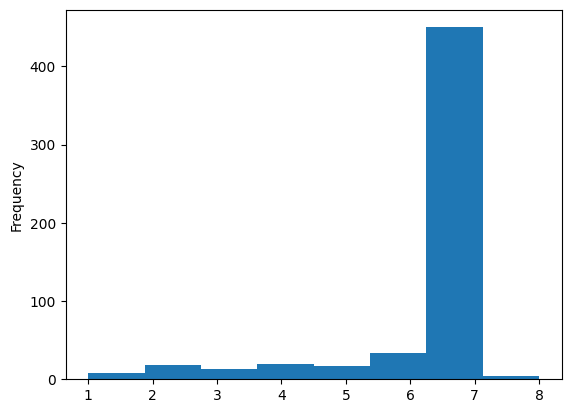

In [19]:
label_df['class'].plot.hist(bins=8)

Видно, что в не так много есть экземаляров выборки, где лейблов мало. Поэтому посмотрим на них, при случае исключим, чтобы помочь модели с обучением. Проблемы могут возникнуть на  groundtruth

Давайте оценим экземпляры, где лейблов мало

In [20]:
label_df[label_df['class'] < 5].count()

class    59
dtype: int64

In [22]:
images = []
for path in tqdm(train_paths[0]):
    file = path[0:-4].split('/')[-1][:-1]
    if file in label_df.index[:]:
        images += [draw_bb(path,train_df)]

100%|██████████| 563/563 [00:03<00:00, 181.24it/s]


In [ ]:
create_animation(images)

После просмотра изображений, можно сказать, что из первых 59, первые 28 размечены плохо, кроме картинок под номерами [0,5, 17]. Примем решение просто убрать их из датасета. Остальные 30 слишком плохого качества, чтобы я, как человек мог там что-то классифицировать, что размечено не было. Их попробуем оставить.

In [24]:
train_df.drop(train_df[train_df['file'].isin(label_df.reset_index().iloc[:29]['file'])].index,inplace=True)
train_df.shape

(3575, 6)

In [25]:
ind = [i for i, path in enumerate(train_paths[0]) if path[0:-4].split('/')[-1][:-1] in label_df[:29].index]
tmp = (
        [ele for i, ele in enumerate(train_paths[0]) if i not in ind],
        [ele for i, ele in enumerate(train_paths[1]) if i not in ind],
        [ele for i, ele in enumerate(train_paths[2]) if i not in ind]
)
train_paths = tmp
len(train_paths[0])

534

Cтороны и их отношения

In [26]:
def add_shape_info(df,ipaths):
    
    for path in tqdm(ipaths):
        image = cv2.imread(path)
        file = get_file_name(path)
        H,W = image.shape[0], image.shape[1]
        df.loc[df['file']==file, 'H'] = H
        df.loc[df['file']==file, 'W'] = W
        df.loc[df['file']==file, 'HW_ratio'] = H / W
    return df

In [27]:
test_df = add_shape_info(test_df,test_paths[0])

100%|██████████| 30/30 [00:00<00:00, 181.75it/s]


In [28]:
train_df = add_shape_info(train_df,train_paths[0])

100%|██████████| 534/534 [00:02<00:00, 184.04it/s]


In [30]:
train_df.shape

(3575, 9)

Так как у нас для одной строки есть повторяющиеся названия, учитывать их не будем

In [31]:
test_df.drop_duplicates('file').head()

,class,x_centre,y_centre,x_width,y_height,file,H,W,HW_ratio
0,6,0.085670,0.493631,0.096573,0.859873,ckicup6z1000g246a7fphj2ry,157.0,321.0,0.489097
7,5,0.100385,0.465982,0.086923,0.631579,ckicv7bge000i246amogy2uak,779.0,1300.0,0.599231
14,5,0.117783,0.516204,0.083141,0.754630,ckicz5mvn001m246adc3vvpi8,216.0,433.0,0.498845
21,4,0.110831,0.524457,0.115869,0.788043,ckid0aey1002d246a4yttijxq,184.0,397.0,0.463476
28,6,0.095116,0.521053,0.092545,0.757895,ckie431xs003u246amh9uo6cv,190.0,389.0,0.488432


In [32]:
train_df.drop_duplicates('file')[['H','W','HW_ratio']].describe()

,H,W,HW_ratio
count,534.000000,534.000000,534.000000
mean,142.835206,273.172285,0.574876
std,124.854704,255.114072,0.146919
min,26.000000,52.000000,0.202479
25%,61.000000,97.000000,0.494004
50%,91.500000,140.000000,0.546344
75%,199.750000,397.000000,0.672776
max,1303.000000,2506.000000,1.282051


Построим гистограммы

<Axes: ylabel='Frequency'>

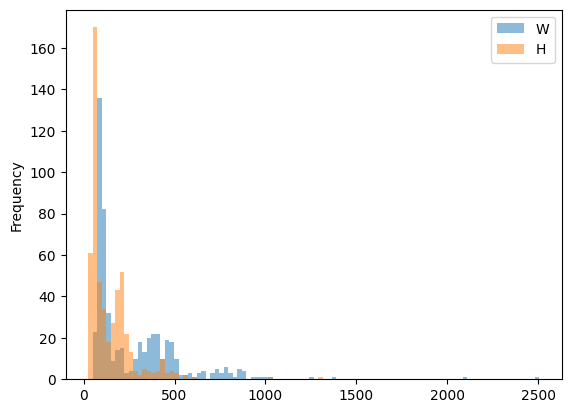

In [34]:
train_df.drop_duplicates('file')[['W','H']].plot.hist(bins=100,alpha=0.5)

<Axes: ylabel='Frequency'>

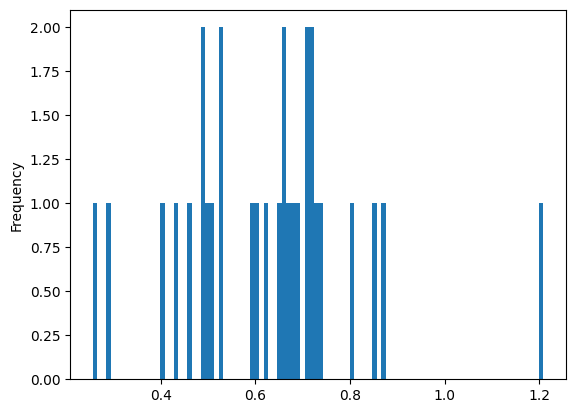

In [35]:
test_df.drop_duplicates('file')['HW_ratio'].plot.hist(bins=100)

<Axes: ylabel='Frequency'>

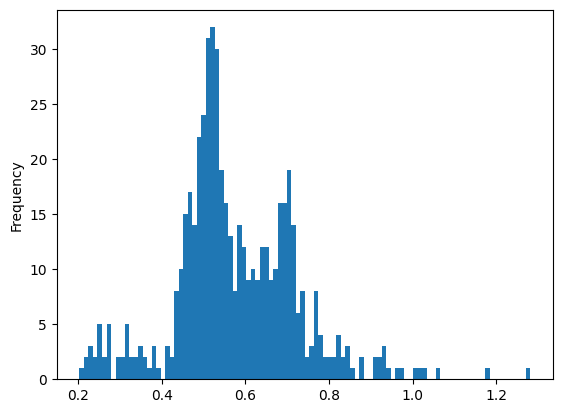

In [36]:
train_df.drop_duplicates('file')['HW_ratio'].plot.hist(bins=100)

Видно, что в основном отношение высоты к ширине около 0.5

Разброс достаточно велик, а значит стоит как-то преобразовать(или откинуть) выделяющиеся изображения так, чтобы при обучении они не мешали.

Наблюдается бимодальность

Можно добавить паддинг или просто применить resize

Для тестовой выборки что-то с уверенностью сказать сложно

Оценим баланс классов

<Axes: ylabel='Frequency'>

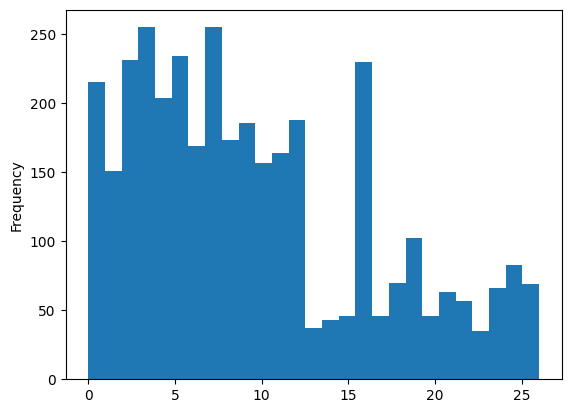

In [37]:
train_df['class'].plot.hist(bins=27)

Видно, что присутствует некоторый дисбаланс классов.

Цифр больше, чем букв

In [38]:
train_df['class'].describe()

count    3575.000000
mean        9.521399
std         7.121264
min         0.000000
25%         4.000000
50%         8.000000
75%        15.000000
max        26.000000
Name: class, dtype: float64

Посмотрим на bb

In [39]:
def add_bb_square(ipath,df):
    colors = get_colors()
    image = cv2.imread(ipath)
    H,W = image.shape[0], image.shape[1]
    file = get_file_name(ipath)
    if df[df['file']==file] is not None:
        box = df[df['file']==file]
        box = box.reset_index(drop=True)  
        for i in range(len(box)):
            x = box.iloc[i]['x_centre']
            y = box.iloc[i]['y_centre']
            w = box.iloc[i]['x_width']
            h = box.iloc[i]['y_height']
            x0 = ((x-w/2)*W).astype(int)
            y0 = ((y-h/2)*H).astype(int)
            x1 = ((x+w/2)*W).astype(int)
            y1 = ((y+h/2)*H).astype(int)
            df.loc[(df['file'] == file) & (df['class'] == box.iloc[i]['class']), 'bb_square'] = (x1 - x0) * (y1 - y0)
    return df

In [40]:
train_df['bb_square'] = 0

In [41]:
for path in tqdm(train_paths[0]):
    train_df = add_bb_square(path,train_df)

100%|██████████| 534/534 [00:07<00:00, 67.35it/s]


<Axes: ylabel='Frequency'>

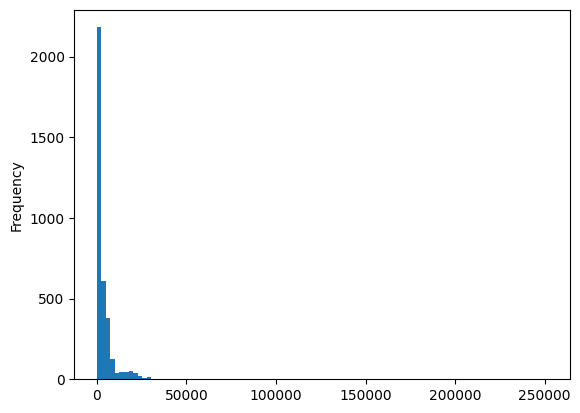

In [42]:
train_df['bb_square'].plot.hist(bins=100)

<Axes: ylabel='Frequency'>

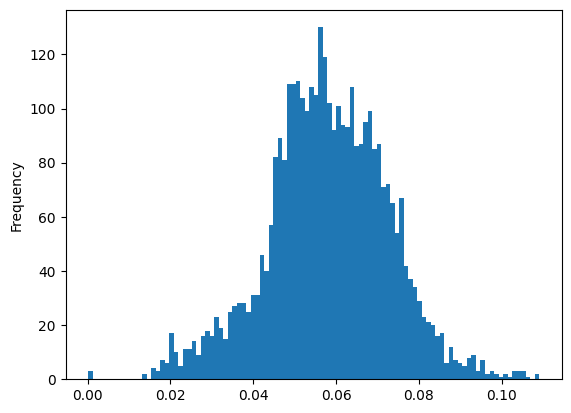

In [43]:
train_df['norm_bb_square'] = train_df['x_width'] * train_df['y_height']
train_df['norm_bb_square'].plot.hist(bins=100)

In [44]:
train_df['norm_bb_square'].describe()

count    3575.000000
mean        0.058025
std         0.014685
min         0.000161
25%         0.049004
50%         0.057808
75%         0.068060
max         0.109010
Name: norm_bb_square, dtype: float64

Если смотреть на нормализированную площадь bb, то проблем быть не должно

Также и с ненормализированной.

Одна мода, маленькая дисперсия

In [45]:
train_df['bb_ratio'] = train_df['x_width'] / train_df['y_height']

In [46]:
train_df['bb_ratio'].describe()

count    3575.000000
mean        0.144656
std         0.040061
min         0.047645
25%         0.117094
50%         0.137083
75%         0.169328
max         0.709677
Name: bb_ratio, dtype: float64

<Axes: ylabel='Frequency'>

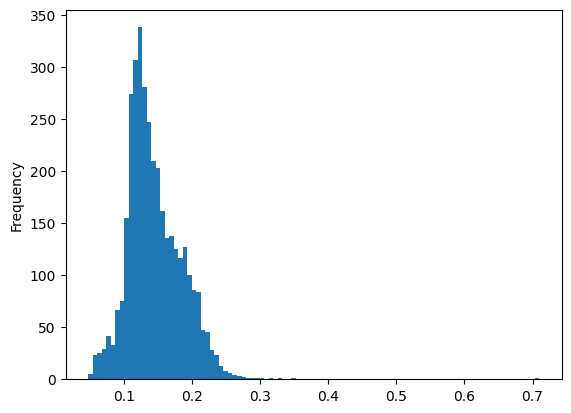

In [47]:
train_df['bb_ratio'].plot.hist(bins=100)

Видно, что отношение сторон имеет одну моду, примерно 0,15


И не слишком большую дисперсию, а значит bb имеют примерно одинаковую форму, что хорошо скажется на обучение при resize

In [48]:
train_df.head()

,class,x_centre,y_centre,x_width,y_height,file,H,W,HW_ratio,bb_square,norm_bb_square,bb_ratio
0,0,0.114880,0.563636,0.041575,0.618182,ckictsenl0000246a2itn28ts,110.0,457.0,0.2407,1311,0.025701,0.067254
1,5,0.198031,0.527273,0.041575,0.672727,ckictsenl0000246a2itn28ts,110.0,457.0,0.2407,1332,0.027969,0.061801
2,2,0.288840,0.495455,0.048140,0.754545,ckictsenl0000246a2itn28ts,110.0,457.0,0.2407,1764,0.036324,0.063800
3,8,0.378556,0.490909,0.048140,0.745455,ckictsenl0000246a2itn28ts,110.0,457.0,0.2407,1782,0.035886,0.064578
4,18,0.589716,0.504545,0.054705,0.736364,ckictsenl0000246a2itn28ts,110.0,457.0,0.2407,2050,0.040282,0.074290


# Разделение на выборки

In [49]:
!rm -rf datasets

In [50]:
os.makedirs('datasets', exist_ok=True)
os.makedirs('datasets/train', exist_ok=True)
os.makedirs('datasets/valid', exist_ok=True)
os.makedirs('datasets/test', exist_ok=True)

In [51]:
from distutils.dir_util import copy_tree
copy_tree('/kaggle/input/ksa-number-plates1/KSA Number Plates/test', '/kaggle/working/datasets/test')
None

Выберем виладационую выборку, так чтобы там присутствовали все классы

<Axes: ylabel='Frequency'>

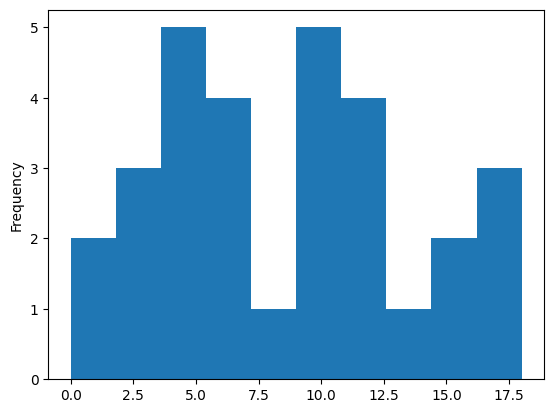

In [52]:
train_df.iloc[10:40]['class'].plot.hist()

In [53]:
val_ind = [i for i in range(10,40)]

In [54]:
for i in range(len(train_paths[0])):
    ifile = train_paths[0][i].split('/')[-1]
    tfile = train_paths[1][i].split('/')[-1]
    ipath = train_paths[0][i]
    tpath = train_paths[1][i]
    if i not in val_ind:
        copyfile(ipath, f'datasets/train/{ifile}')
        copyfile(tpath, f'datasets/train/{tfile}')
    else:
        copyfile(ipath, f'datasets/valid/{ifile}')
        copyfile(tpath, f'datasets/valid/{tfile}')

In [55]:
N=list(range(27))
Name=[]
for i in range(27):
    Name+=[str(i).zfill(2)]
class_map=dict(zip(N,Name))  
class_map

{0: '00',
 1: '01',
 2: '02',
 3: '03',
 4: '04',
 5: '05',
 6: '06',
 7: '07',
 8: '08',
 9: '09',
 10: '10',
 11: '11',
 12: '12',
 13: '13',
 14: '14',
 15: '15',
 16: '16',
 17: '17',
 18: '18',
 19: '19',
 20: '20',
 21: '21',
 22: '22',
 23: '23',
 24: '24',
 25: '25',
 26: '26'}

In [56]:
import yaml

plate_yaml = dict(
    train = 'train',
    val = 'valid',
    test = 'test',
    nc = 27,
    names = Name
)

with open('plate.yaml', 'w') as outfile:
    yaml.dump(plate_yaml, outfile, default_flow_style=True)
    
%cat plate.yaml

{names: ['00', '01', '02', '03', '04', '05', '06', '07', 08, 09, '10', '11', '12',
    '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25',
    '26'], nc: 27, test: test, train: train, val: valid}


In [57]:
%pip install ultralytics

  Obtaining dependency information for ultralytics from https://files.pythonhosted.org/packages/e0/06/f07c56b8080af737ad42991fc1bb4e94da490c5227225c8337b8c248bd44/ultralytics-8.1.2-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.7/699.7 kB 25.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [58]:
! pip install --upgrade pip

  Obtaining dependency information for pip from https://files.pythonhosted.org/packages/15/aa/3f4c7bcee2057a76562a5b33ecbd199be08cdb4443a02e26bd2c3cf6fc39/pip-23.3.2-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.1 MB/s eta 0:00:0000:010:01
  Attempting uninstall: pip
    Found existing installation: pip 23.2.1
    Uninstalling pip-23.2.1:
      Successfully uninstalled pip-23.2.1


In [66]:
!pip install cloud-tpu-client==0.10 torch==1.12.0 https://storage.googleapis.com/tpu-pytorch/wheels/colab/torch_xla-1.12-cp37-cp37m-linux_x86_64.whl

ERROR: torch_xla-1.12-cp37-cp37m-linux_x86_64.whl is not a supported wheel on this platform.


In [59]:
import torch

In [60]:
torch.cuda.is_available()

True

In [61]:
!nvidia-smi


Fri Jan 19 23:38:03 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0              26W / 250W |      2MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [62]:
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.1.2 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5359.4/8062.4 GB disk)


In [63]:
model = YOLO("yolov8x.pt") 

100%|██████████| 131M/131M [00:00<00:00, 290MB/s] 


In [64]:
#!apt-get update && apt-get install ffmpeg libsm6 libxext6  -y
!apt-get update && apt-get install libgl1

Get:1 https://packages.cloud.google.com/apt cloud-sdk InRelease [6361 B]
Get:2 https://packages.cloud.google.com/apt google-fast-socket InRelease [5015 B]
Hit:3 http://packages.cloud.google.com/apt gcsfuse-focal InRelease             
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1581 B]
Get:5 https://packages.cloud.google.com/apt cloud-sdk/main amd64 Packages [578 kB]
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]    
Hit:7 http://archive.ubuntu.com/ubuntu jammy InRelease 
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [662 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]     
Get:11 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [1600 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1321 kB]
Get:13 http://a

In [65]:
!yolo task=detect mode=train model=yolov8x.pt data=plate.yaml epochs=40 imgsz=640

Ultralytics YOLOv8.1.2 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=plate.yaml, epochs=40, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

Результаты

In [68]:
res_paths = []
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:] == '.png' or filename[-4:] == '.jpg':
            res_paths+=[(os.path.join(dirname, filename))]
res_paths=sorted(res_paths)
print(len(res_paths))

17


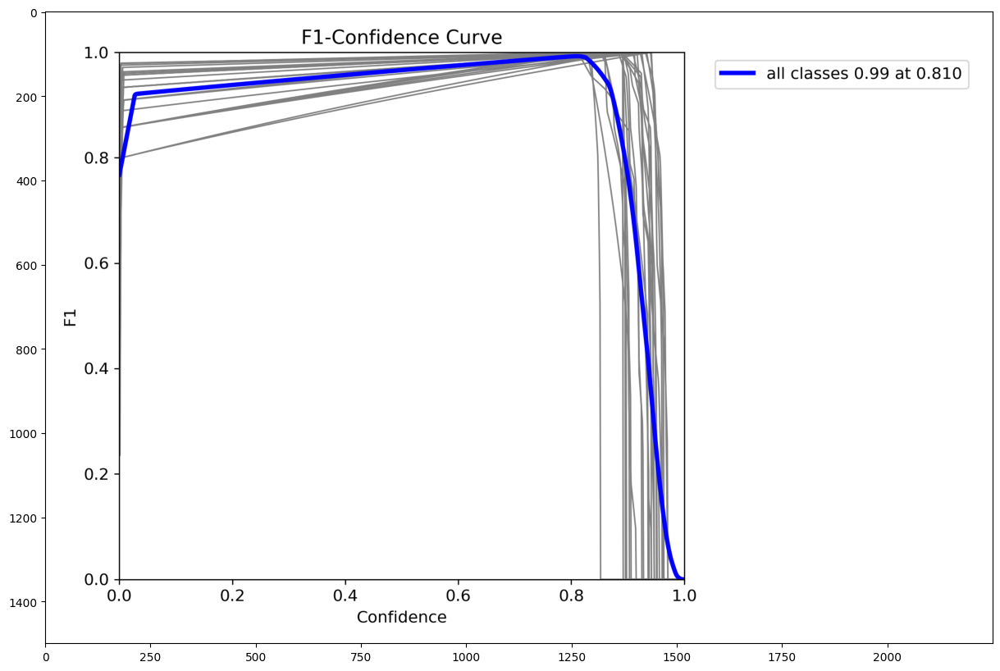

In [72]:
image=np.array(Image.open(res_paths[0]))
plt.figure(figsize=(20,10))
plt.imshow(image)

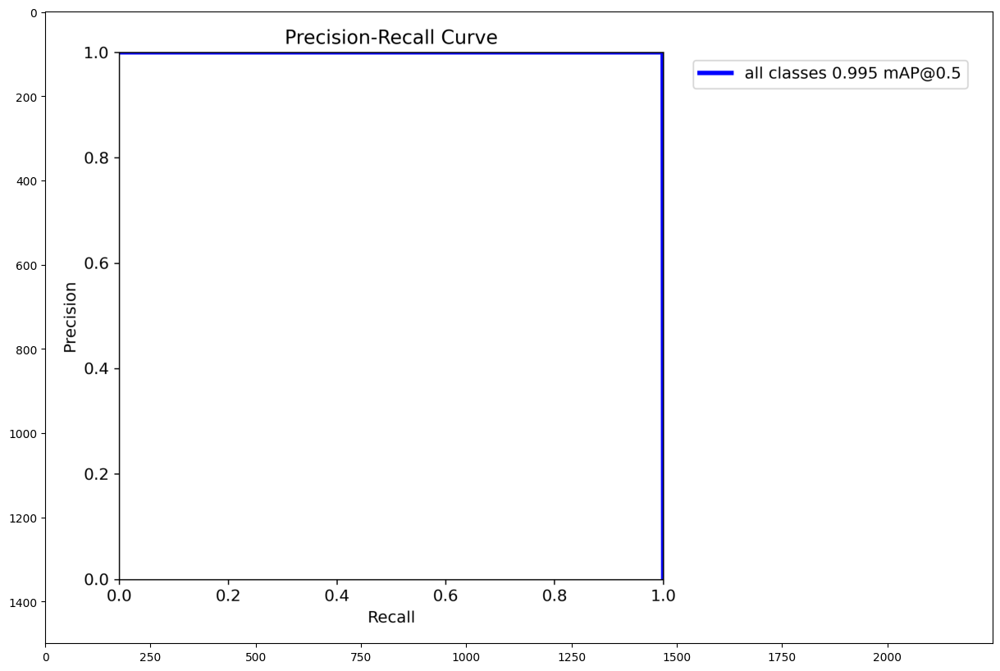

In [73]:
image=np.array(Image.open(res_paths[1]))
plt.figure(figsize=(20,10))
plt.imshow(image)

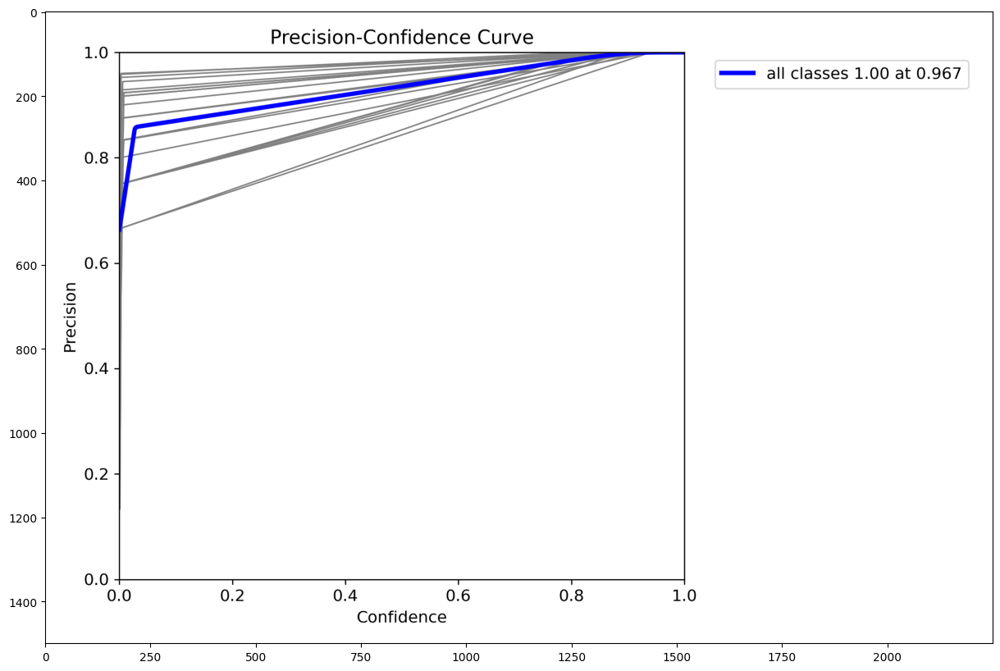

In [74]:
image=np.array(Image.open(res_paths[2]))
plt.figure(figsize=(20,10))
plt.imshow(image)

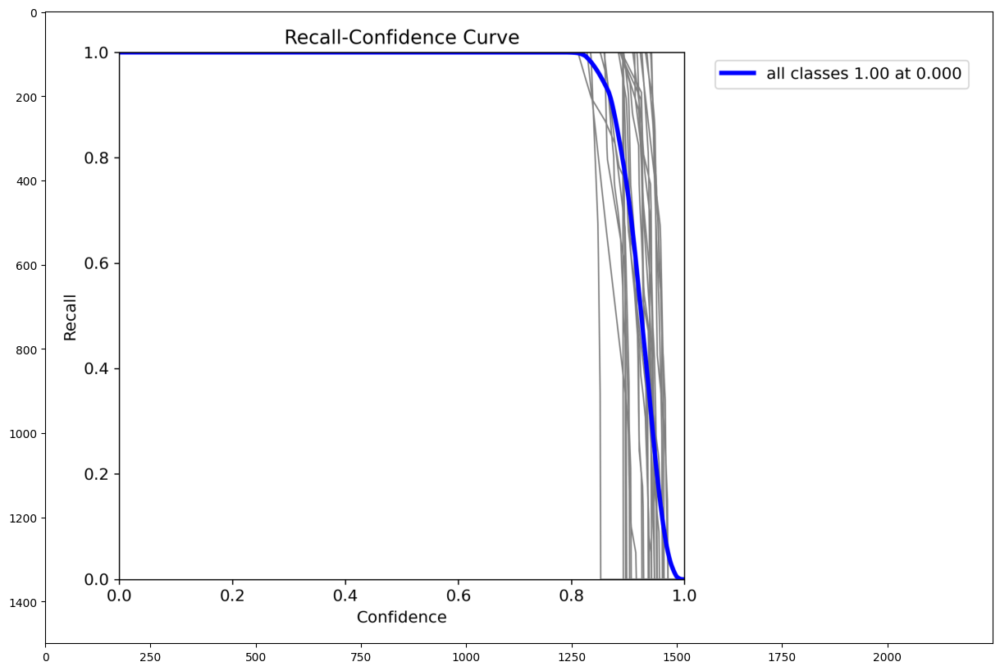

In [75]:
image=np.array(Image.open(res_paths[3]))
plt.figure(figsize=(20,10))
plt.imshow(image)

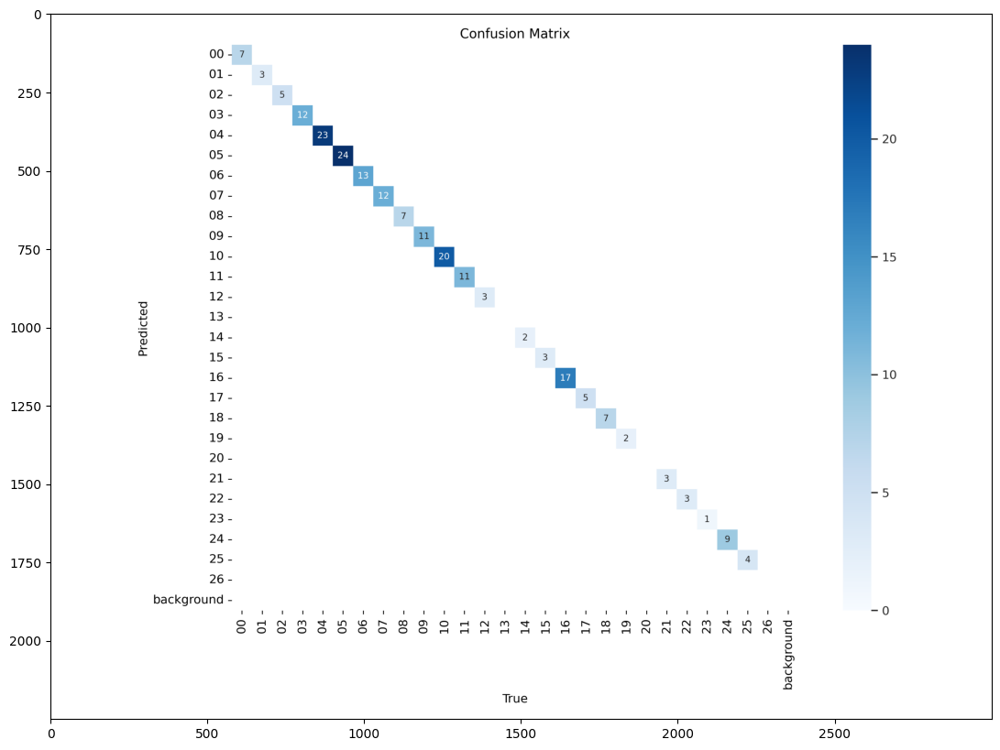

In [76]:
image=np.array(Image.open(res_paths[4]))
plt.figure(figsize=(20,10))
plt.imshow(image)

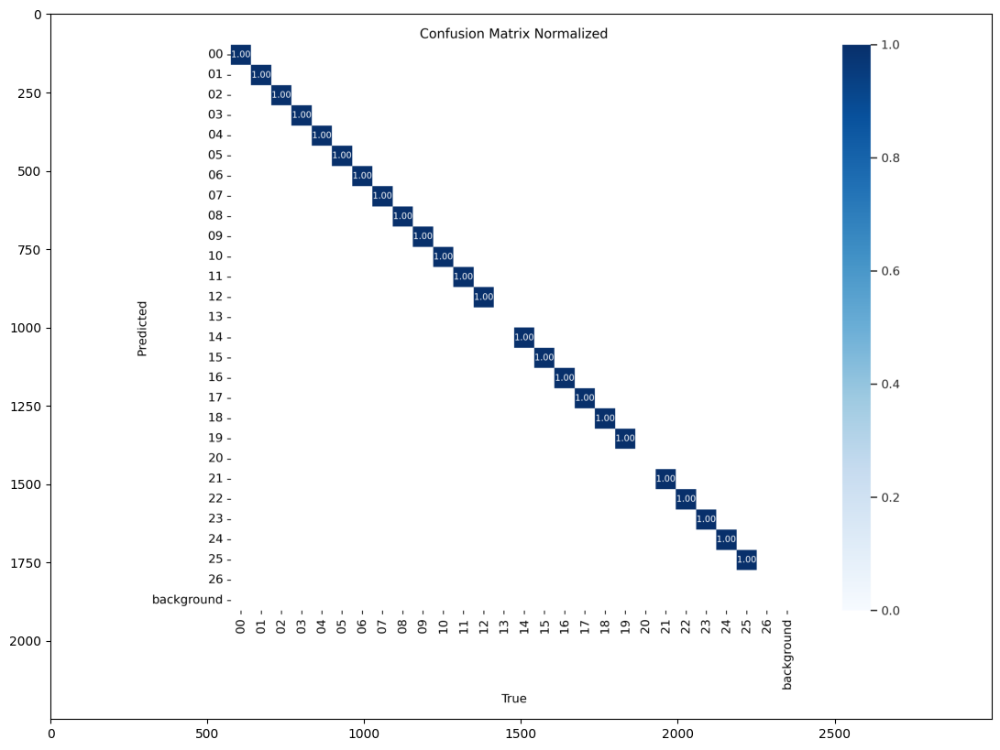

In [77]:
image=np.array(Image.open(res_paths[5]))
plt.figure(figsize=(20,10))
plt.imshow(image)

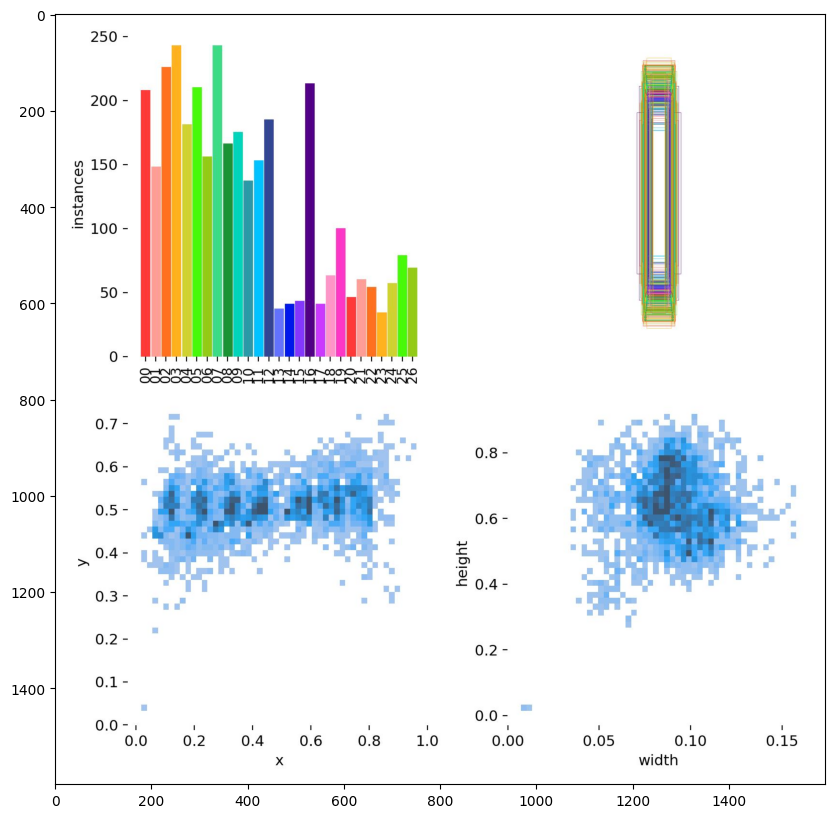

In [78]:
image=np.array(Image.open(res_paths[6]))
plt.figure(figsize=(20,10))
plt.imshow(image)

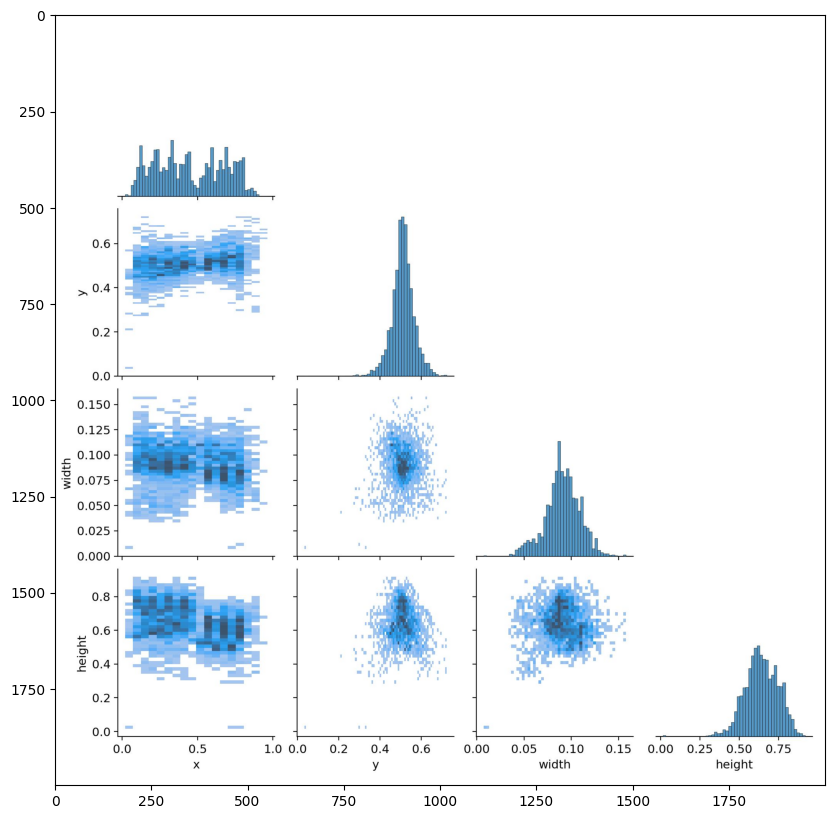

In [79]:
image=np.array(Image.open(res_paths[7]))
plt.figure(figsize=(20,10))
plt.imshow(image)

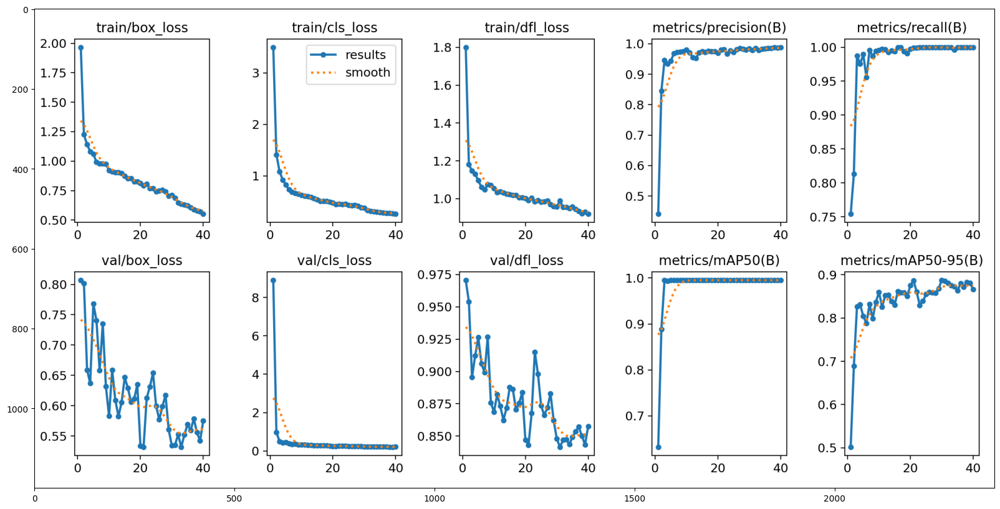

In [80]:
image=np.array(Image.open(res_paths[8]))
plt.figure(figsize=(20,10))
plt.imshow(image)

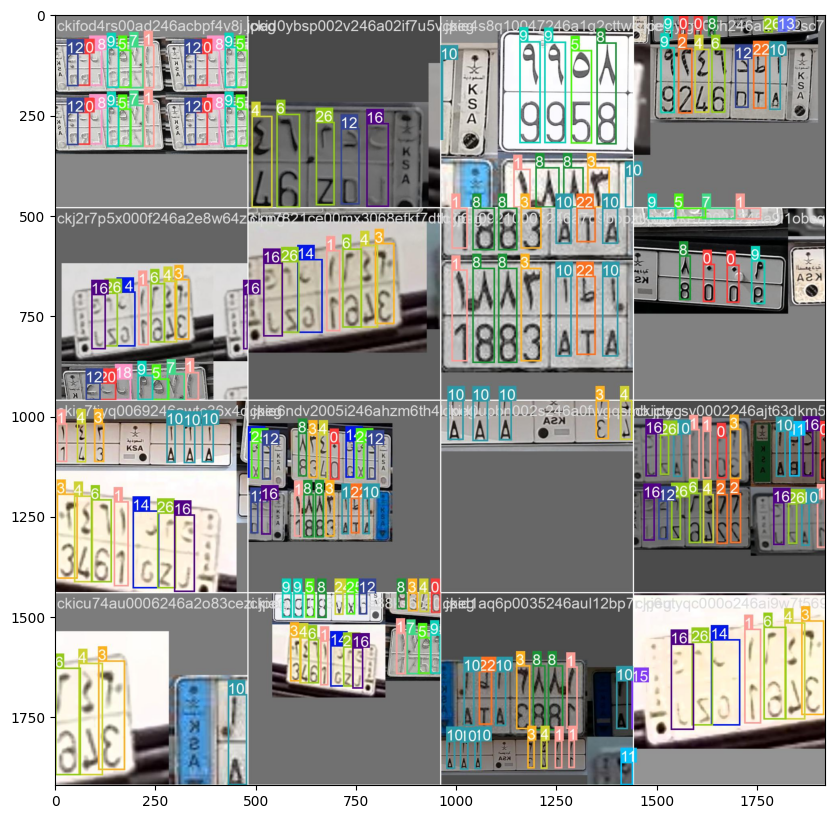

In [81]:
image=np.array(Image.open(res_paths[9]))
plt.figure(figsize=(20,10))
plt.imshow(image)

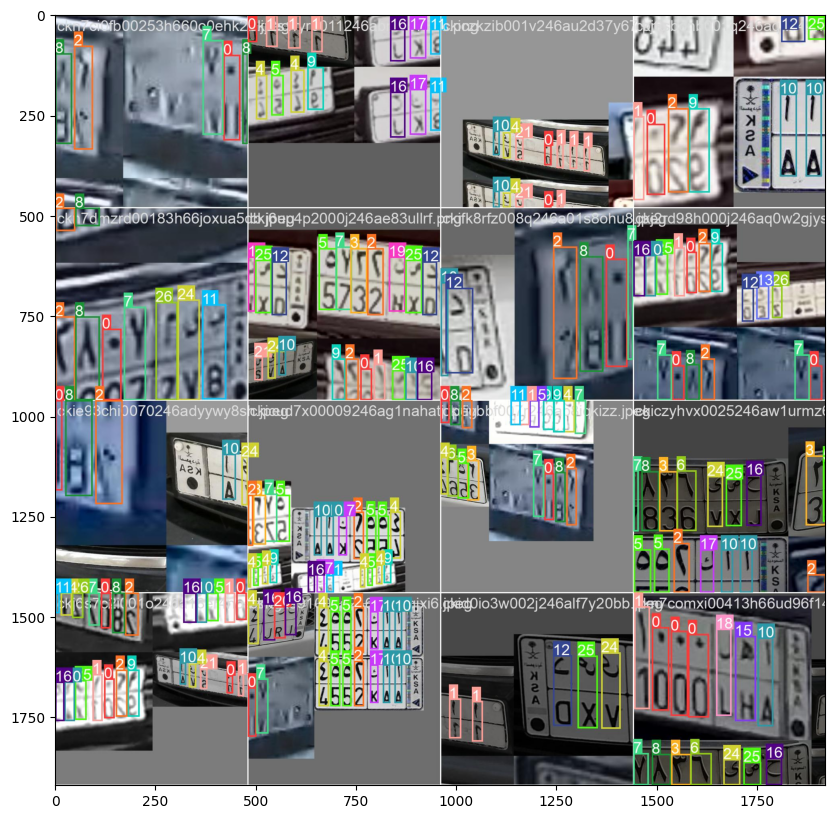

In [82]:
image=np.array(Image.open(res_paths[10]))
plt.figure(figsize=(20,10))
plt.imshow(image)

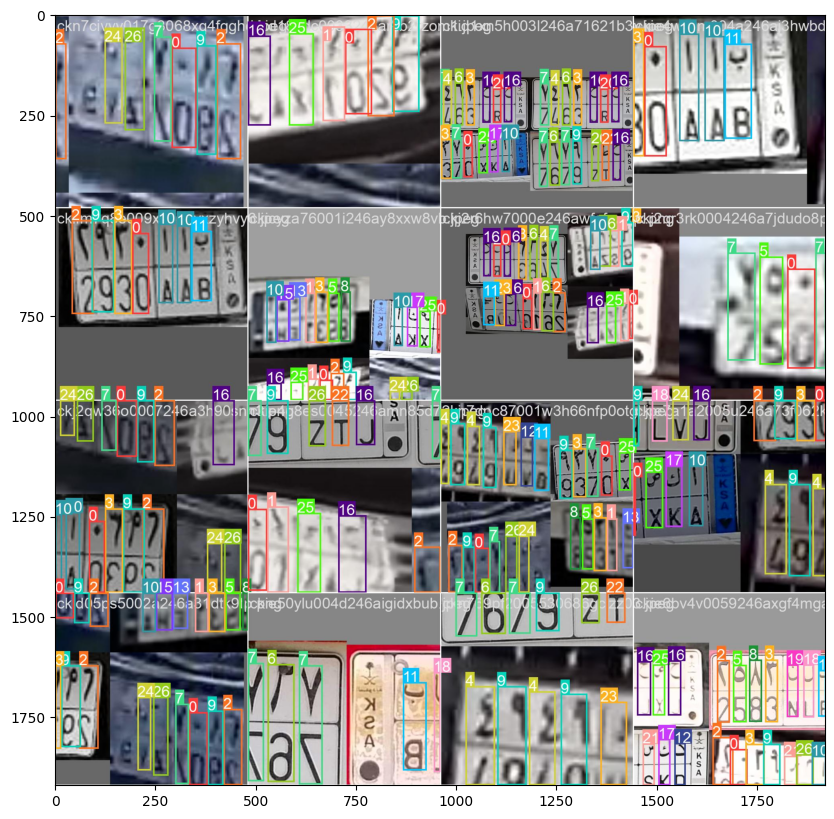

In [83]:
image=np.array(Image.open(res_paths[11]))
plt.figure(figsize=(20,10))
plt.imshow(image)

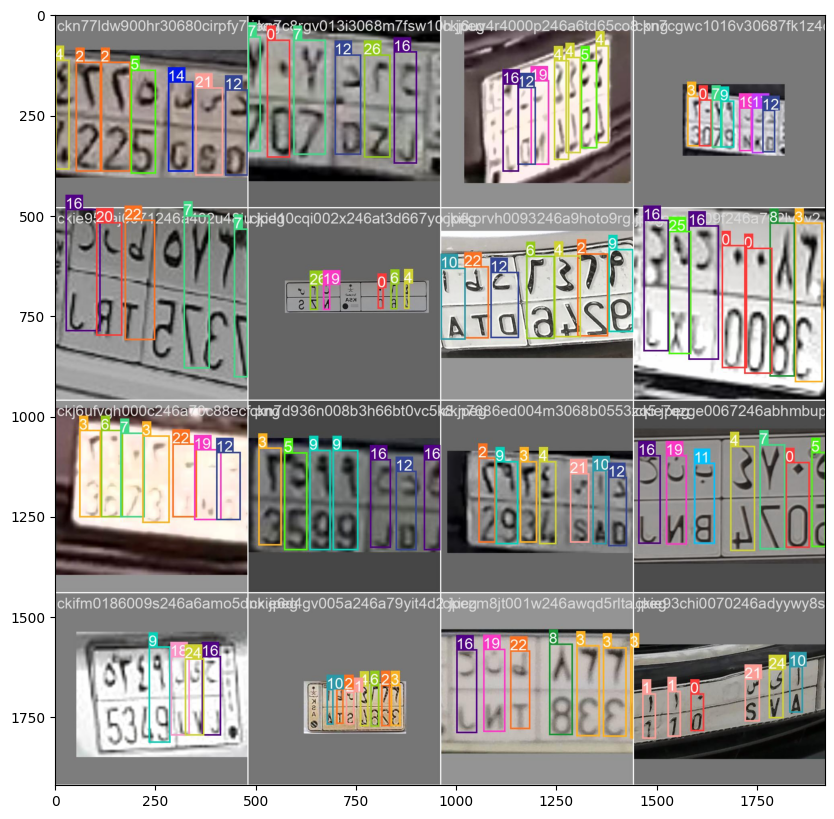

In [84]:
image=np.array(Image.open(res_paths[13]))
plt.figure(figsize=(20,10))
plt.imshow(image)

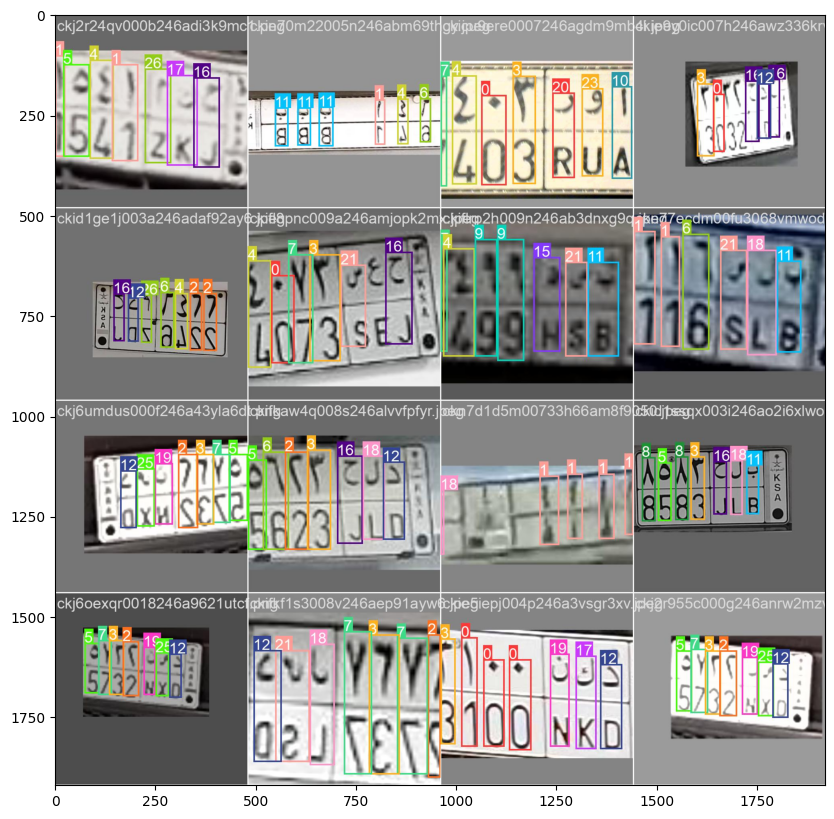

In [85]:
image=np.array(Image.open(res_paths[14]))
plt.figure(figsize=(20,10))
plt.imshow(image)

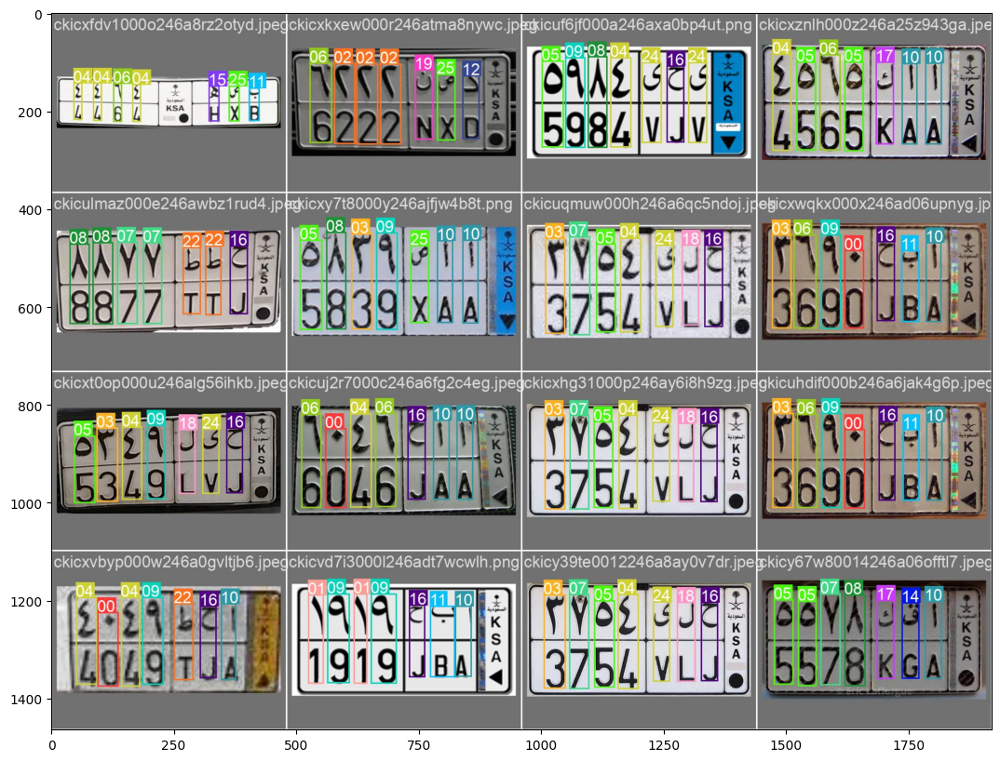

In [86]:
image=np.array(Image.open(res_paths[15]))
plt.figure(figsize=(20,10))
plt.imshow(image)

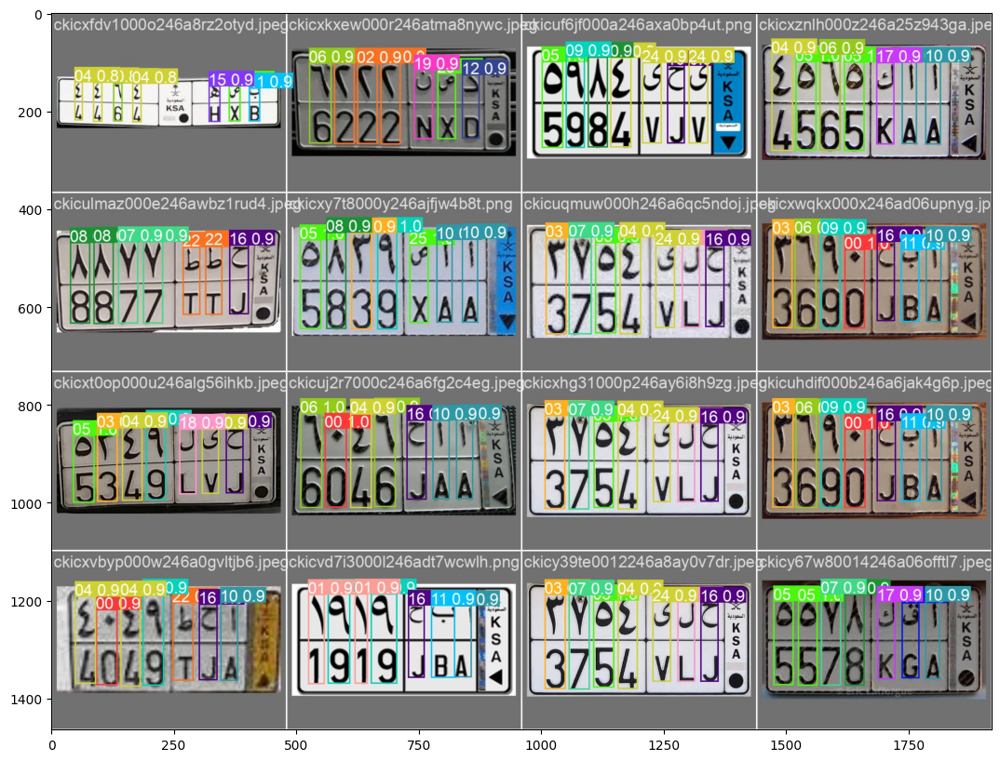

In [87]:
image=np.array(Image.open(res_paths[16]))
plt.figure(figsize=(20,10))
plt.imshow(image)

# Сбор результатов

In [89]:
best_path0='runs/detect/train/weights/best.pt'
source0='datasets/test'

In [137]:
yolo_test_paths = []
for dirname, _, filenames in os.walk(source0):
    for filename in filenames:
        if filename[-4:] != '.xml' and filename[-4:] != '.txt':
            yolo_test_paths += [(os.path.join(dirname, filename))]
yolo_test_paths=sorted(yolo_test_paths)
yolo_test_paths

['datasets/test/ckicup6z1000g246a7fphj2ry.jpeg',
 'datasets/test/ckicv7bge000i246amogy2uak.jpeg',
 'datasets/test/ckicz5mvn001m246adc3vvpi8.jpeg',
 'datasets/test/ckid0aey1002d246a4yttijxq.jpeg',
 'datasets/test/ckie431xs003u246amh9uo6cv.jpeg',
 'datasets/test/ckie4cimr003x246aoznobsso.jpeg',
 'datasets/test/ckie5frk9004n246afbzcg2bv.jpeg',
 'datasets/test/ckie5gyti004o246apj0w8xa5.jpeg',
 'datasets/test/ckie7hpqn0060246ajpom24hc.jpeg',
 'datasets/test/ckie9t257007f246azz6y65h1.jpeg',
 'datasets/test/ckiea7roj007n246anpat44vr.jpeg',
 'datasets/test/ckifja6dj0080246ah2pbu5c7.jpeg',
 'datasets/test/ckifob8ae00ac246aspnnzb4s.jpeg',
 'datasets/test/ckifoesk900ae246adon2oi36.jpeg',
 'datasets/test/ckj2qkszj0000246a97ibd89g.png',
 'datasets/test/ckj2qofgm0002246aka7idva2.png',
 'datasets/test/ckj2rbzak000i246a29ubfv5x.png',
 'datasets/test/ckj2rfvrd000l246axyi8kp5x.png',
 'datasets/test/ckj2rx1lh000x246aka477bwh.png',
 'datasets/test/ckj6p7y6j001g246aah9sd8u9.png',
 'datasets/test/ckj6u1kxg0

# Тесты

In [138]:
model2 = YOLO(best_path0)

In [93]:
!yolo task=detect mode=predict model={best_path0} conf=0.01 source={source0}

Ultralytics YOLOv8.1.2 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 268 layers, 68149569 parameters, 0 gradients, 257.5 GFLOPs

image 1/30 /kaggle/working/datasets/test/ckicup6z1000g246a7fphj2ry.jpeg: 320x640 1 00, 1 04, 2 06s, 2 10s, 1 16, 69.2ms
image 2/30 /kaggle/working/datasets/test/ckicv7bge000i246amogy2uak.jpeg: 384x640 2 05s, 4 07s, 1 08, 1 10, 1 14, 1 17, 66.6ms
image 3/30 /kaggle/working/datasets/test/ckicz5mvn001m246adc3vvpi8.jpeg: 320x640 1 04, 2 05s, 1 08, 1 12, 1 16, 1 23, 26.4ms
image 4/30 /kaggle/working/datasets/test/ckid0aey1002d246a4yttijxq.jpeg: 320x640 1 04, 1 06, 1 08, 1 09, 1 16, 1 18, 1 26, 25.1ms
image 5/30 /kaggle/working/datasets/test/ckie431xs003u246amh9uo6cv.jpeg: 320x640 1 02, 1 04, 1 05, 1 06, 1 08, 1 09, 1 10, 1 13, 1 15, 25.1ms
image 6/30 /kaggle/working/datasets/test/ckie4cimr003x246aoznobsso.jpeg: 352x640 1 03, 1 04, 1 05, 1 09, 1 16, 1 18, 1 24, 66.3ms
image 7/30 /kaggle/working/datasets/test/ckie5frk900

# Результаты тестов

In [94]:
results = model2.predict(source0,conf=0.01)
print(len(results))


image 1/30 /kaggle/working/datasets/test/ckicup6z1000g246a7fphj2ry.jpeg: 320x640 1 00, 1 04, 2 06s, 2 10s, 1 16, 90.1ms
image 2/30 /kaggle/working/datasets/test/ckicv7bge000i246amogy2uak.jpeg: 384x640 2 05s, 4 07s, 1 08, 1 10, 1 14, 1 17, 69.5ms
image 3/30 /kaggle/working/datasets/test/ckicz5mvn001m246adc3vvpi8.jpeg: 320x640 1 04, 2 05s, 1 08, 1 12, 1 16, 1 23, 26.0ms
image 4/30 /kaggle/working/datasets/test/ckid0aey1002d246a4yttijxq.jpeg: 320x640 1 04, 1 06, 1 08, 1 09, 1 16, 1 18, 1 26, 24.9ms
image 5/30 /kaggle/working/datasets/test/ckie431xs003u246amh9uo6cv.jpeg: 320x640 1 02, 1 04, 1 05, 1 06, 1 08, 1 09, 1 10, 1 13, 1 15, 25.0ms
image 6/30 /kaggle/working/datasets/test/ckie4cimr003x246aoznobsso.jpeg: 352x640 1 03, 1 04, 1 05, 1 09, 1 16, 1 18, 1 24, 68.8ms
image 7/30 /kaggle/working/datasets/test/ckie5frk9004n246afbzcg2bv.jpeg: 192x640 1 02, 1 04, 2 05s, 1 11, 1 16, 1 24, 66.0ms
image 8/30 /kaggle/working/datasets/test/ckie5gyti004o246apj0w8xa5.jpeg: 352x640 2 04s, 1 05, 1 07, 2

In [144]:
results[0].boxes.data

tensor([[ 11.4417,  10.0558,  43.1089, 146.3444,   0.9510,   6.0000],
        [117.3020,   9.7110, 148.2687, 144.9297,   0.9444,   6.0000],
        [ 47.8475,  31.2691,  77.7877, 146.0067,   0.9422,   0.0000],
        [164.1745,  19.8604, 192.4400, 134.8916,   0.9145,  16.0000],
        [ 83.9186,   9.8627, 113.4751, 146.7020,   0.9091,   4.0000],
        [201.6707,  19.8849, 224.8498, 134.2799,   0.9055,  10.0000],
        [234.5298,  19.6314, 258.6686, 134.4683,   0.8967,  10.0000]], device='cuda:0')

In [145]:
yolo_test_df = pd.DataFrame(columns=range(6))
for i in range(len(results)):
    if results[26].boxes.data.shape[0] > 0:
        add = pd.DataFrame(results[i].boxes.data.cpu().numpy()).astype(np.float64)
        file = get_file_name(yolo_test_paths[i].split('/')[-1])
        add = add.assign(file=file)
        yolo_test_df = pd.concat([yolo_test_df,add],axis=0)
yolo_test_df.columns=['x','y','x2','y2','confidence','class','file']
yolo_test_df

/tmp/ipykernel_26/3454634132.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  yolo_test_df = pd.concat([yolo_test_df,add],axis=0)


,x,y,x2,y2,confidence,class,file
0,11.441698,10.055832,43.108860,146.344360,0.951041,6.0,ckicup6z1000g246a7fphj2ry
1,117.302002,9.711022,148.268738,144.929657,0.944369,6.0,ckicup6z1000g246a7fphj2ry
2,47.847534,31.269148,77.787659,146.006699,0.942237,0.0,ckicup6z1000g246a7fphj2ry
3,164.174545,19.860392,192.439987,134.891556,0.914517,16.0,ckicup6z1000g246a7fphj2ry
4,83.918571,9.862710,113.475128,146.702042,0.909093,4.0,ckicup6z1000g246a7fphj2ry
...,...,...,...,...,...,...,...
0,46.423542,3.900110,56.861794,47.567783,0.890605,3.0,ckn7dibfl00au3h66aqhhzp0m
1,35.462006,5.979434,45.051231,46.615292,0.863366,8.0,ckn7dibfl00au3h66aqhhzp0m
2,24.639273,1.854490,34.253315,46.233379,0.835797,8.0,ckn7dibfl00au3h66aqhhzp0m
3,12.571584,1.947217,22.626530,39.498962,0.833012,8.0,ckn7dibfl00au3h66aqhhzp0m


In [146]:
yolo_test_df['class'] = yolo_test_df['class'].apply(lambda x: class_map[int(x)])
yolo_test_df = yolo_test_df.reset_index(drop=True)
np.sort(yolo_test_df['class'].unique().astype(str))

array(['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26'], dtype='<U2')

In [150]:
def draw_bb_plain_coord(ipath,df,test_df):
    colors = get_colors()
    image = cv2.imread(ipath)
    H,W = image.shape[0],image.shape[1]
    file = get_file_name(ipath)
    if df[df['file']==file] is not None: 
        box = df[df['file']==file]
        box = box.reset_index(drop=True)  
        for i in range(len(box)):
            label = box.iloc[i]['class']
            x0 = int(box.iloc[i]['x'])
            y0 = int(box.iloc[i]['y'])
            x2 = int(box.iloc[i]['x2'])
            y2 = int(box.iloc[i]['y2'])
            ci=colors[int(label)%14]
            cv2.rectangle(image, (x0, y0), (x2, y2), ci, 1)
    
    if test_df[test_df['file']==file] is not None: 
        box = test_df[test_df['file']==file]
        box = box.reset_index(drop=True)  
        for i in range(len(box)):
            label = box.iloc[i]['class']
            x = box.iloc[i]['x_centre']
            y = box.iloc[i]['y_centre']
            w = box.iloc[i]['x_width']
            h = box.iloc[i]['y_height']
            x0 = ((x - w / 2) * W).astype(int)
            y0 = ((y - h / 2) * H).astype(int)
            x1 = ((x + w / 2) * W).astype(int)
            y1 = ((y + h / 2) * H).astype(int)
            ci = colors[int(label) % 14]
            cv2.rectangle(image, (x0, y0), (x1, y1), ci, 1)
        
    return image

In [ ]:
def draw_bb(ipath,df):
    colors = get_colors()
    image = cv2.imread(ipath)
    H,W = image.shape[0],image.shape[1]
    file = get_file_name(ipath)
    if df[df['file']==file] is not None: 
        box = df[df['file']==file]
        box = box.reset_index(drop=True)  
        for i in range(len(box)):
            label = box.iloc[i]['class']
            x = box.iloc[i]['x_centre']
            y = box.iloc[i]['y_centre']
            w = box.iloc[i]['x_width']
            h = box.iloc[i]['y_height']
            x0 = ((x - w / 2) * W).astype(int)
            y0 = ((y - h / 2) * H).astype(int)
            x1 = ((x + w / 2) * W).astype(int)
            y1 = ((y + h / 2) * H).astype(int)
            ci = colors[int(label) % 14]
            cv2.rectangle(image, (x0, y0), (x1, y1), ci, 1)
    
    return image

In [151]:
images2=[]
for path in tqdm(yolo_test_paths):
    images2+=[draw_bb_plain_coord(path,yolo_test_df,test_df)]

 37%|███▋      | 11/30 [00:00<00:00, 105.53it/s]

datasets/test/ckicup6z1000g246a7fphj2ry.jpeg
datasets/test/ckicv7bge000i246amogy2uak.jpeg
datasets/test/ckicz5mvn001m246adc3vvpi8.jpeg
datasets/test/ckid0aey1002d246a4yttijxq.jpeg
datasets/test/ckie431xs003u246amh9uo6cv.jpeg
datasets/test/ckie4cimr003x246aoznobsso.jpeg
datasets/test/ckie5frk9004n246afbzcg2bv.jpeg
datasets/test/ckie5gyti004o246apj0w8xa5.jpeg
datasets/test/ckie7hpqn0060246ajpom24hc.jpeg
datasets/test/ckie9t257007f246azz6y65h1.jpeg
datasets/test/ckiea7roj007n246anpat44vr.jpeg
datasets/test/ckifja6dj0080246ah2pbu5c7.jpeg
datasets/test/ckifob8ae00ac246aspnnzb4s.jpeg
datasets/test/ckifoesk900ae246adon2oi36.jpeg
datasets/test/ckj2qkszj0000246a97ibd89g.png
datasets/test/ckj2qofgm0002246aka7idva2.png
datasets/test/ckj2rbzak000i246a29ubfv5x.png
datasets/test/ckj2rfvrd000l246axyi8kp5x.png
datasets/test/ckj2rx1lh000x246aka477bwh.png
datasets/test/ckj6p7y6j001g246aah9sd8u9.png
datasets/test/ckj6u1kxg0002246a2l9x47kt.png
datasets/test/ckj6u30bj0003246ad1yv8vtg.png
datasets/test/ckj6

100%|██████████| 30/30 [00:00<00:00, 118.38it/s]

datasets/test/ckn76t4jc009w30687n2lcrv6.jpeg
datasets/test/ckn7azkx000vz30681dukt0g6.jpeg
datasets/test/ckn7b8dn700z830683o4wnr49.jpeg
datasets/test/ckn7cludx018d3068ezkbk89i.jpeg
datasets/test/ckn7cvs8i00613h6619wlyc3u.jpeg
datasets/test/ckn7dibfl00au3h66aqhhzp0m.jpeg


In [152]:
create_animation(images2)